In [1]:
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import sklearn
from sklearn import datasets
import sys
import tensorflow as tf
from tensorflow import keras
import time

#Visualisation
#import geopandas as gpd
import seaborn as sb

# HOUSING CALIFORNIE
### OBJECTIF: Prédire le prix des maisons dans un district

In [2]:
houses = sklearn.datasets.fetch_california_housing()
print(houses.DESCR)

.. _california_housing_dataset:

California Housing dataset
--------------------------

**Data Set Characteristics:**

    :Number of Instances: 20640

    :Number of Attributes: 8 numeric, predictive attributes and the target

    :Attribute Information:
        - MedInc        median income in block
        - HouseAge      median house age in block
        - AveRooms      average number of rooms
        - AveBedrms     average number of bedrooms
        - Population    block population
        - AveOccup      average house occupancy
        - Latitude      house block latitude
        - Longitude     house block longitude

    :Missing Attribute Values: None

This dataset was obtained from the StatLib repository.
http://lib.stat.cmu.edu/datasets/

The target variable is the median house value for California districts.

This dataset was derived from the 1990 U.S. census, using one row per census
block group. A block group is the smallest geographical unit for which the U.S.
Census Bur

In [3]:
dfhouses = pd.DataFrame(data=houses.data, columns=houses.feature_names)
dfhouses['target']= houses.target

In [4]:
print(dfhouses.shape)
dfhouses

(20640, 9)


,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,target
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,37.88,-122.23,4.526
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,37.86,-122.22,3.585
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,37.85,-122.24,3.521
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,37.85,-122.25,3.413
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,37.85,-122.25,3.422
5,4.0368,52.0,4.761658,1.103627,413.0,2.139896,37.85,-122.25,2.697
6,3.6591,52.0,4.931907,0.951362,1094.0,2.128405,37.84,-122.25,2.992
7,3.1200,52.0,4.797527,1.061824,1157.0,1.788253,37.84,-122.25,2.414
8,2.0804,42.0,4.294118,1.117647,1206.0,2.026891,37.84,-122.26,2.267
9,3.6912,52.0,4.970588,0.990196,1551.0,2.172269,37.84,-122.25,2.611


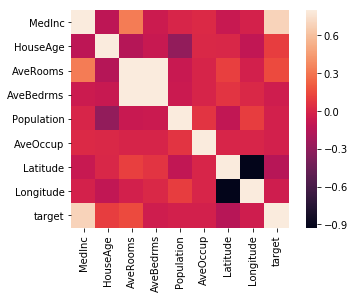

In [5]:
sb.heatmap(dfhouses.corr(), vmax = .8, square = True)
plt.show()

Découpage des données

In [6]:
from sklearn.model_selection import train_test_split
X_train_f, X_test, y_train_f, y_test = train_test_split(houses.data,houses.target,
                                                    test_size=0.20,
                                                    random_state=42,
                                                    shuffle=True
                                                   )
X_train, X_valid, y_train, y_valid = train_test_split(X_train_f,
                                                      y_train_f,
                                                      test_size=0.1,
                                                      shuffle=True
                                                     )


Normalisation

In [7]:
from sklearn.preprocessing import StandardScaler
scaler= StandardScaler()
Xs_train = scaler.fit_transform(X_train)
Xs_test = scaler.transform(X_test)
Xs_valid = scaler.transform(X_valid)

Construction du réseau de neurones

In [8]:
#Applatissement en 2D des donnéés
#Test du nombre de neuronnes necessaires
#Determiner les sorties necessaires (prix)
# Import `Sequential` from `keras.models`
from keras.models import Sequential

# Import `Dense` from `keras.layers`
from keras.layers import Dense, Flatten, Activation



Using TensorFlow backend.


In [9]:
from keras import optimizers
# Initialize the constructor
model = Sequential()
model.add(Dense(16, activation='relu'))
model.add(Dense(16, activation='relu'))
model.add(Dense(16, activation='relu'))
model.add(Dense(1,activation='linear'))
learning_rate=1e-4
sgd=optimizers.SGD(lr=learning_rate)
model.compile(loss='mean_squared_error',optimizer=sgd,metrics=['accuracy'])


In [10]:
history=model.fit(Xs_train, y_train, verbose=1, epochs=5
                  , validation_data=(Xs_valid,y_valid),shuffle=True)

Train on 14860 samples, validate on 1652 samples
Epoch 1/5
14860/14860 [==============================] - 1s 50us/step - loss: 4.7489 - acc: 1.3459e-04 - val_loss: 3.6118 - val_acc: 6.0533e-04
Epoch 2/5
14860/14860 [==============================] - 0s 29us/step - loss: 3.1961 - acc: 0.0020 - val_loss: 2.4106 - val_acc: 0.0036
Epoch 3/5
14860/14860 [==============================] - 0s 29us/step - loss: 2.2914 - acc: 0.0032 - val_loss: 1.7131 - val_acc: 0.0036
Epoch 4/5
14860/14860 [==============================] - 0s 29us/step - loss: 1.7635 - acc: 0.0030 - val_loss: 1.3411 - val_acc: 0.0036
Epoch 5/5
14860/14860 [==============================] - 0s 29us/step - loss: 1.4457 - acc: 0.0028 - val_loss: 1.1377 - val_acc: 0.0042


In [11]:
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 16)                144       
_________________________________________________________________
dense_2 (Dense)              (None, 16)                272       
_________________________________________________________________
dense_3 (Dense)              (None, 16)                272       
_________________________________________________________________
dense_4 (Dense)              (None, 1)                 17        
Total params: 705
Trainable params: 705
Non-trainable params: 0
_________________________________________________________________


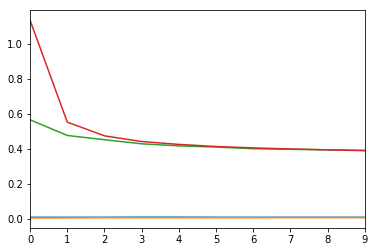

In [28]:
df_hist = pd.DataFrame(history.history)
df_hist.val_acc.plot()
df_hist.acc.plot()
df_hist.val_loss.plot()
df_hist.loss.plot()
plt.show()

In [13]:
def test_lr(l):
    model = Sequential()
    model.add(Dense(16, activation='relu'))
    model.add(Dense(16, activation='relu'))
    model.add(Dense(1,activation='linear'))
    learning_rate=l
    sgd=optimizers.SGD(lr=learning_rate)
    model.compile(loss='mean_squared_error',optimizer=sgd,metrics=['accuracy'])
    return model

def train_model(l):
    model=test_lr(l)
    history=model.fit(Xs_train, y_train, verbose=1, epochs=5
                  , validation_data=(Xs_valid,y_valid),shuffle=True)
    df_hist=pd.DataFrame(history.history)
    hist_scaler = StandardScaler()
    dfs_hist=df_hist.copy()
    dfs_hist[dfs_hist.columns]=hist_scaler.fit_transform(df_hist)
    dfs_hist.plot()
    plt.show()
    plt.close()
    

Train on 14860 samples, validate on 1652 samples
Epoch 1/5
14860/14860 [==============================] - 1s 44us/step - loss: 6.1497 - acc: 0.0000e+00 - val_loss: 5.0122 - val_acc: 0.0000e+00
Epoch 2/5
14860/14860 [==============================] - 0s 28us/step - loss: 4.4014 - acc: 6.7295e-05 - val_loss: 3.7021 - val_acc: 6.0533e-04
Epoch 3/5
14860/14860 [==============================] - 0s 28us/step - loss: 3.2585 - acc: 0.0011 - val_loss: 2.7656 - val_acc: 0.0036
Epoch 4/5
14860/14860 [==============================] - 0s 28us/step - loss: 2.4159 - acc: 0.0030 - val_loss: 2.0633 - val_acc: 0.0036
Epoch 5/5
14860/14860 [==============================] - 0s 28us/step - loss: 1.7982 - acc: 0.0032 - val_loss: 1.5595 - val_acc: 0.0036


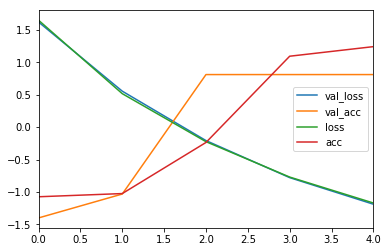

In [14]:
train_model(1e-4)

Train on 14860 samples, validate on 1652 samples
Epoch 1/5
14860/14860 [==============================] - 1s 45us/step - loss: 3.0915 - acc: 0.0021 - val_loss: 1.6350 - val_acc: 0.0042
Epoch 2/5
14860/14860 [==============================] - 0s 28us/step - loss: 1.4211 - acc: 0.0026 - val_loss: 1.1365 - val_acc: 0.0048
Epoch 3/5
14860/14860 [==============================] - 0s 27us/step - loss: 1.0680 - acc: 0.0023 - val_loss: 0.9277 - val_acc: 0.0048
Epoch 4/5
14860/14860 [==============================] - 0s 28us/step - loss: 0.8763 - acc: 0.0024 - val_loss: 0.7970 - val_acc: 0.0048
Epoch 5/5
14860/14860 [==============================] - 0s 27us/step - loss: 0.7662 - acc: 0.0024 - val_loss: 0.7248 - val_acc: 0.0054


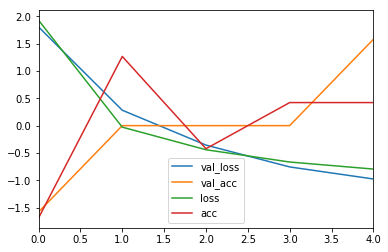

In [15]:
train_model(3e-4)

Implémentation du wrapper Kerasregressor afin de créer un prédicteur compatible ScikitLearn

In [16]:
from keras.wrappers.scikit_learn import KerasRegressor


def build_model(n_hidden=1,n_neurons=len(dfhouses.columns)//2, learning_rate=3e-4):
    model = Sequential()
    model.add(Dense(8, activation='relu'))
    [model.add(Dense(n_neurons, activation='relu'))for i in range(n_hidden)]
    model.add(Dense(4, activation='relu'))
    model.add(Dense(1,activation='linear'))
    sgd=optimizers.SGD(lr=learning_rate)
    model.compile(loss='mean_squared_error',optimizer=sgd,metrics=['accuracy'])
    return model


In [17]:
estimator = KerasRegressor(build_model,nb_epoch=30, batch_size=100, verbose=False)

from keras.callbacks import EarlyStopping,ModelCheckpoint

callbacks=[EarlyStopping(
                    monitor='val_acc',
                    patience=5,
                    verbose=1,
                    mode='auto'),
                ModelCheckpoint('weights.{epoch:02d}-{acc:.2f}.hdf5',
                    monitor='val_acc',
                    verbose=1,
                    save_best_only=True,
                    save_weights_only=False,
                    mode='auto')]

history=estimator.fit(Xs_train, y_train, epochs=5,validation_data=(Xs_valid,y_valid),shuffle=True )

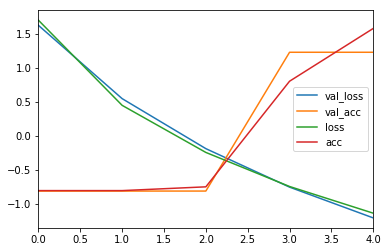

In [18]:
df_hist=pd.DataFrame(history.history)
hist_scaler = StandardScaler()
dfs_hist=df_hist.copy()
dfs_hist[dfs_hist.columns]=hist_scaler.fit_transform(df_hist)
dfs_hist.plot()
plt.show()
plt.close()

Ajout du selecteur de modele  RandomizedSearchCV

In [19]:
from sklearn import model_selection

params={
    'n_hidden':np.arange(5),
    #'learning_rate':np.reciprocal((3e-3,3e-2)),
    'epochs':[5,10],
    #'batch_size':[32,50,100]
}

clf=model_selection.RandomizedSearchCV(
    estimator,
    params,
    n_iter=10,
    cv=3)

clf.fit(Xs_train, y_train, validation_data=(Xs_valid,y_valid),callbacks=callbacks)


Epoch 00001: val_acc improved from -inf to 0.00121, saving model to weights.01-0.00.hdf5

Epoch 00002: val_acc did not improve from 0.00121

Epoch 00003: val_acc improved from 0.00121 to 0.00242, saving model to weights.03-0.00.hdf5

Epoch 00004: val_acc improved from 0.00242 to 0.00303, saving model to weights.04-0.00.hdf5

Epoch 00005: val_acc improved from 0.00303 to 0.00363, saving model to weights.05-0.00.hdf5

Epoch 00001: val_acc did not improve from 0.00363

Epoch 00002: val_acc did not improve from 0.00363

Epoch 00003: val_acc did not improve from 0.00363

Epoch 00004: val_acc did not improve from 0.00363

Epoch 00005: val_acc did not improve from 0.00363

Epoch 00001: val_acc did not improve from 0.00363

Epoch 00002: val_acc did not improve from 0.00363

Epoch 00003: val_acc did not improve from 0.00363

Epoch 00004: val_acc did not improve from 0.00363

Epoch 00005: val_acc did not improve from 0.00363

Epoch 00001: val_acc did not improve from 0.00363

Epoch 00002: val_a


Epoch 00005: val_acc did not improve from 0.00666

Epoch 00006: val_acc did not improve from 0.00666

Epoch 00007: val_acc did not improve from 0.00666

Epoch 00008: val_acc did not improve from 0.00666

Epoch 00009: val_acc did not improve from 0.00666
Epoch 00009: early stopping

Epoch 00001: val_acc did not improve from 0.00666

Epoch 00002: val_acc did not improve from 0.00666

Epoch 00003: val_acc did not improve from 0.00666

Epoch 00004: val_acc did not improve from 0.00666

Epoch 00005: val_acc did not improve from 0.00666

Epoch 00006: val_acc did not improve from 0.00666

Epoch 00007: val_acc did not improve from 0.00666

Epoch 00008: val_acc did not improve from 0.00666

Epoch 00009: val_acc did not improve from 0.00666

Epoch 00010: val_acc did not improve from 0.00666

Epoch 00001: val_acc did not improve from 0.00666

Epoch 00002: val_acc did not improve from 0.00666

Epoch 00003: val_acc did not improve from 0.00666

Epoch 00004: val_acc did not improve from 0.00666

Ep

RandomizedSearchCV(cv=3, error_score='raise-deprecating',
          estimator=<keras.wrappers.scikit_learn.KerasRegressor object at 0x0000022183399BE0>,
          fit_params=None, iid='warn', n_iter=10, n_jobs=None,
          param_distributions={'n_hidden': array([0, 1, 2, 3, 4]), 'epochs': [5, 10]},
          pre_dispatch='2*n_jobs', random_state=None, refit=True,
          return_train_score='warn', scoring=None, verbose=0)

In [20]:
# Utility function to report best scores
def report(results, n_top=3):
    for i in range(1, n_top + 1):
        candidates = np.flatnonzero(results['rank_test_score'] == i)
        for candidate in candidates:
            print("Model with rank: {0}".format(i))
            print("Mean validation score: {0:.3f} (std: {1:.3f})".format(
                  results['mean_test_score'][candidate],
                  results['std_test_score'][candidate]))
            print("Parameters: {0}".format(results['params'][candidate]))
            print("")

In [21]:
report(clf.cv_results_)

Model with rank: 1
Mean validation score: -1.355 (std: 0.091)
Parameters: {'n_hidden': 4, 'epochs': 10}

Model with rank: 2
Mean validation score: -1.387 (std: 0.347)
Parameters: {'n_hidden': 3, 'epochs': 10}

Model with rank: 3
Mean validation score: -1.405 (std: 0.169)
Parameters: {'n_hidden': 0, 'epochs': 10}



In [22]:
def build_model(n_hidden=1,n_neurons=len(dfhouses.columns)//2, optimizer='sgd'):
    model = Sequential()
    model.add(Dense(8, activation='relu'))
    [model.add(Dense(n_neurons, activation='relu'))for i in range(n_hidden)]
    model.add(Dense(4, activation='relu'))
    model.add(Dense(1,activation='linear'))
    model.compile(loss='mean_squared_error',optimizer=optimizer,metrics=['accuracy'])
    return model

estimator = KerasRegressor(build_model,nb_epoch=30, batch_size=100, verbose=False)

params={
    'n_hidden':np.arange(5),
    #'learning_rate':np.reciprocal((3e-3,3e-2)),
    'epochs':[5,10],
    #'batch_size':[32,50,100],
    'optimizer':['SGD','RMSprop','Adagrad','Adam']
}

clf=model_selection.RandomizedSearchCV(
    estimator,
    params,
    n_iter=10,
    cv=3)

clf.fit(Xs_train, y_train, validation_data=(Xs_valid,y_valid),callbacks=callbacks)


Epoch 00001: val_acc did not improve from 0.00666

Epoch 00002: val_acc did not improve from 0.00666

Epoch 00003: val_acc did not improve from 0.00666

Epoch 00004: val_acc did not improve from 0.00666

Epoch 00005: val_acc did not improve from 0.00666

Epoch 00006: val_acc did not improve from 0.00666
Epoch 00006: early stopping

Epoch 00001: val_acc did not improve from 0.00666

Epoch 00002: val_acc did not improve from 0.00666

Epoch 00003: val_acc did not improve from 0.00666

Epoch 00004: val_acc did not improve from 0.00666

Epoch 00005: val_acc did not improve from 0.00666

Epoch 00006: val_acc did not improve from 0.00666

Epoch 00007: val_acc did not improve from 0.00666

Epoch 00008: val_acc did not improve from 0.00666

Epoch 00009: val_acc improved from 0.00666 to 0.00726, saving model to weights.09-0.00.hdf5

Epoch 00010: val_acc did not improve from 0.00726

Epoch 00001: val_acc did not improve from 0.00726

Epoch 00002: val_acc did not improve from 0.00726

Epoch 00003


Epoch 00003: val_acc did not improve from 0.00787

Epoch 00004: val_acc did not improve from 0.00787

Epoch 00005: val_acc did not improve from 0.00787

Epoch 00001: val_acc did not improve from 0.00787

Epoch 00002: val_acc did not improve from 0.00787

Epoch 00003: val_acc did not improve from 0.00787

Epoch 00004: val_acc did not improve from 0.00787

Epoch 00005: val_acc did not improve from 0.00787

Epoch 00001: val_acc did not improve from 0.00787

Epoch 00002: val_acc did not improve from 0.00787

Epoch 00003: val_acc did not improve from 0.00787

Epoch 00004: val_acc did not improve from 0.00787

Epoch 00005: val_acc did not improve from 0.00787

Epoch 00001: val_acc did not improve from 0.00787

Epoch 00002: val_acc did not improve from 0.00787

Epoch 00003: val_acc did not improve from 0.00787

Epoch 00004: val_acc did not improve from 0.00787

Epoch 00005: val_acc did not improve from 0.00787

Epoch 00006: val_acc did not improve from 0.00787

Epoch 00007: val_acc did not i

RandomizedSearchCV(cv=3, error_score='raise-deprecating',
          estimator=<keras.wrappers.scikit_learn.KerasRegressor object at 0x000002219A44EC88>,
          fit_params=None, iid='warn', n_iter=10, n_jobs=None,
          param_distributions={'n_hidden': array([0, 1, 2, 3, 4]), 'epochs': [5, 10], 'optimizer': ['SGD', 'RMSprop', 'Adagrad', 'Adam']},
          pre_dispatch='2*n_jobs', random_state=None, refit=True,
          return_train_score='warn', scoring=None, verbose=0)

In [23]:
report(clf.cv_results_)

Model with rank: 1
Mean validation score: -0.449 (std: 0.020)
Parameters: {'optimizer': 'RMSprop', 'n_hidden': 1, 'epochs': 10}

Model with rank: 2
Mean validation score: -0.510 (std: 0.069)
Parameters: {'optimizer': 'Adam', 'n_hidden': 4, 'epochs': 10}

Model with rank: 3
Mean validation score: -0.514 (std: 0.075)
Parameters: {'optimizer': 'Adam', 'n_hidden': 3, 'epochs': 10}



Visualisation et test du meilleur modele

Train on 14860 samples, validate on 1652 samples
Epoch 1/10
14860/14860 [==============================] - 3s 176us/step - loss: 1.1366 - acc: 0.0034 - val_loss: 0.5661 - val_acc: 0.0073
Epoch 2/10
14860/14860 [==============================] - 1s 53us/step - loss: 0.5526 - acc: 0.0038 - val_loss: 0.4761 - val_acc: 0.0073
Epoch 3/10
14860/14860 [==============================] - 1s 53us/step - loss: 0.4739 - acc: 0.0046 - val_loss: 0.4516 - val_acc: 0.0073
Epoch 4/10
14860/14860 [==============================] - 1s 52us/step - loss: 0.4412 - acc: 0.0045 - val_loss: 0.4282 - val_acc: 0.0079
Epoch 5/10
14860/14860 [==============================] - 1s 53us/step - loss: 0.4249 - acc: 0.0047 - val_loss: 0.4165 - val_acc: 0.0079
Epoch 6/10
14860/14860 [==============================] - 1s 52us/step - loss: 0.4127 - acc: 0.0046 - val_loss: 0.4097 - val_acc: 0.0073
Epoch 7/10
14860/14860 [==============================] - 1s 53us/step - loss: 0.4049 - acc: 0.0046 - val_loss: 0.4002 - val_acc

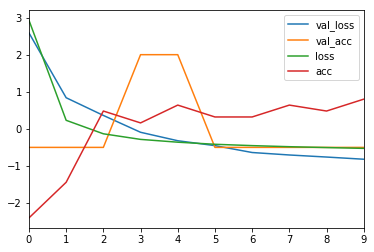

In [24]:
m=build_model(optimizer='RMSprop',n_hidden=1)
history=m.fit(Xs_train, y_train, verbose=1, epochs=10
                  , validation_data=(Xs_valid,y_valid),shuffle=True)

df_hist=pd.DataFrame(history.history)
hist_scaler = StandardScaler()
dfs_hist=df_hist.copy()
dfs_hist[dfs_hist.columns]=hist_scaler.fit_transform(df_hist)
dfs_hist.plot()
plt.show()
plt.close()

In [25]:
result=m.evaluate(Xs_test,y_test)
print(result)

4128/4128 [==============================] - 0s 37us/step
[0.3960416931514592, 0.003875968992248062]


In [64]:
import folium

loc_map=folium.Map(location=dfhouses[['Latitude','Longitude']].iloc[0],
                   zoom_start=10)

for index, row in dfhouses.iterrows():
    folium.CircleMarker([row['Latitude'], row['Longitude']],
                       radius=5,
                       fill_color='BuPu',
                       ).add_to(loc_map)


In [65]:
loc_map

In [70]:
loc_map=folium.Map(location=dfhouses[['Latitude','Longitude']].mean(),
                   zoom_start=3)
folium.Choropleth(
    geo_data=['Latitude','Longitude'],
    name='choropleth',
    data=dfhouses,
    columns=['target'],
    key_on='feature.id',
    fill_color='YlGn',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Price Rate (%)'
).add_to(m)

folium.LayerControl().add_to(m)

IndexError: list index out of range

In [67]:
dfhouses[['Latitude','Longitude']].mean()

Latitude      35.631861
Longitude   -119.569704
dtype: float64